In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [9]:
!nvidia-smi

Fri Sep 19 13:02:43 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   34C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [10]:
import os
HOME = os.getcwd
print(HOME)

<built-in function getcwd>


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.7 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.9 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 3.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.5 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall:

In [11]:
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

from IPython import display
from IPython.display import display, Image
#display.clear_output()

Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6411.5/8062.4 GB disk)


In [12]:
model = YOLO(f'{HOME}/yolov8s.pt')

In [ ]:
Image(filename=f'/kaggle/input/meatfreshnesskaggle2266-augmented/train/images/FRESH-1-_JPG.rf.30947a43a4c785b343f85acd9e2a40f9.jpg', 
      width=500)

In [ ]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img_paths = glob.glob('/kaggle/input/meatfreshnesskaggle2266-augmented/valid/images/*.jpg')[:5]

for img_path in img_paths:
    img = mpimg.imread(img_path)
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.title(img_path.split('/')[-1])
    plt.imshow(img)
    plt.show

In [ ]:
!yolo detect train
data='/kaggle/input/meatfreshnesskaggle2266-augmented/data.yaml'
model=yolov8s.pt
epochs=200
imgsz=640
patience=10

In [ ]:
!mkdir -p /kaggle/working/MRTD_meatFreshness
!cp /kaggle/working/runs/detect/train2/weights/best.pt /kaggle/working//MRTD_meatFreshness/MRTD_meatFreshness.pt

In [ ]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img_paths = glob.glob('/kaggle/working/runs/detect/train2/*.jpg')[:10]

for img_path in img_paths:
    img = mpimg.imread(img_path)
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.title(img_path.split('/')[-1])
    plt.imshow(img)
    plt.show

In [ ]:
y_model = '/kaggle/working/runs/detect/train2'
resplts = [f for f in os.listdir(y_model) if f.endswith(('.png'))]

for res in resplts:
    print(os.path.join(y_model, res))
    display(Image(filename=os.path.join(y_model, res)))

In [ ]:
valBatch = [f for f in os.listdir(y_model) if f.endswith(('.jpg'))]

for val in valBatch:
    print(os.path.join(y_model, val))
    display(Image(filename=os.path.join(y_model, val)))

In [ ]:
# model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

model = YOLO('/kaggle/input/mrtd_meatfreshness_aug1/keras/default/1/MRTD_meatFreshness_aug1.pt')

In [ ]:
from ultralytics import YOLO
import gradio as gr
from PIL import Image

model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

def predict(img):
    results = model(img)
    annotated_img = results[0].plot()  
    return Image.fromarray(annotated_img)

demo = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="filepath", label="Upload an Image"),
    outputs=gr.Image(type="pil", label="Prediction"),
    title="YOLO Object Detection",
    description="Upload a photo and get YOLO predictions."
)

demo.launch(share=True)


# Model 2 training (Dataset testing)

In [15]:
!yolo detect train 
data='/kaggle/input/meatfreshnesskaggle2266-v3-v2mfmrtd-yolov8/data.yaml' 
model=yolov8s.pt 
epochs=200 
imgsz=640 
patience=15

Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/meatfreshnesskaggle2266-v3-v2mfmrtd-yolov8/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=

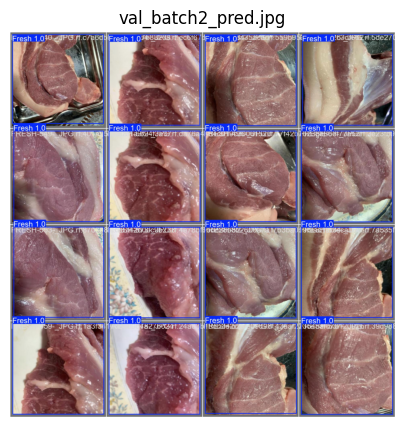

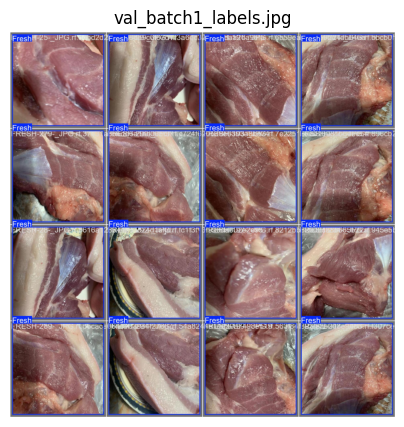

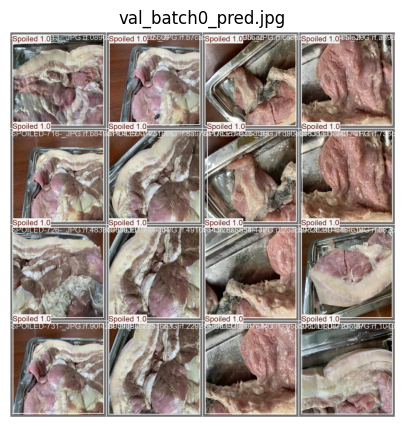

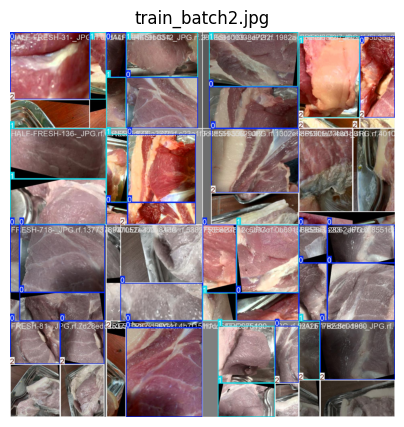

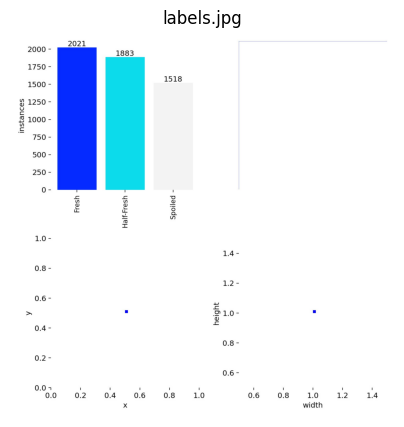

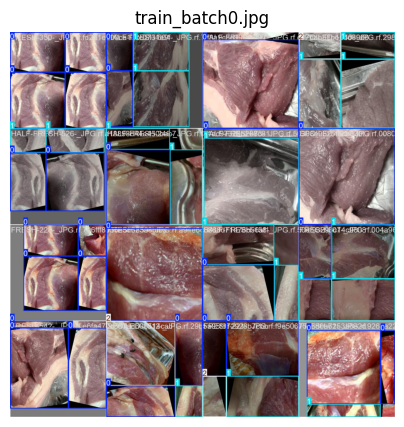

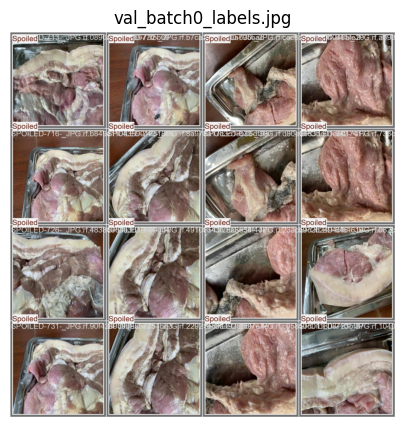

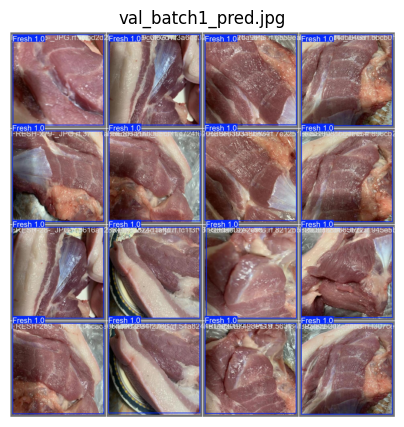

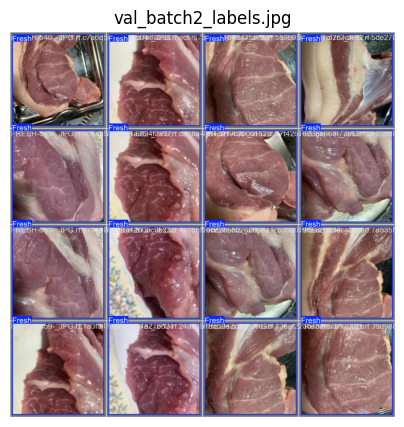

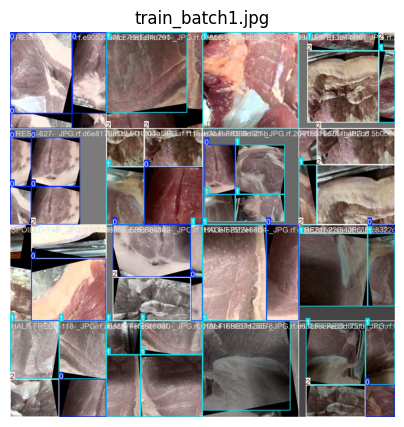

In [17]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img_paths = glob.glob('/kaggle/working/runs/detect/train4/*.jpg')[:10]

for img_path in img_paths:
    img = mpimg.imread(img_path)
    plt.figure(figsize=(5, 5))
    plt.axis('off')
    plt.title(img_path.split('/')[-1])
    plt.imshow(img)
    plt.show

/kaggle/working/runs/detect/train4/BoxF1_curve.png


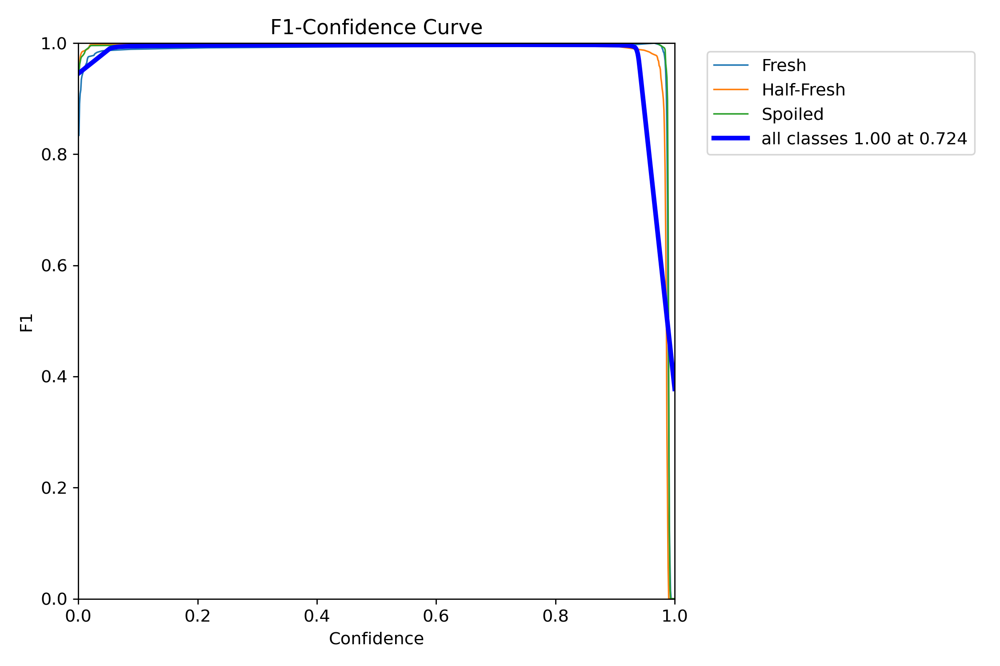

/kaggle/working/runs/detect/train4/confusion_matrix_normalized.png


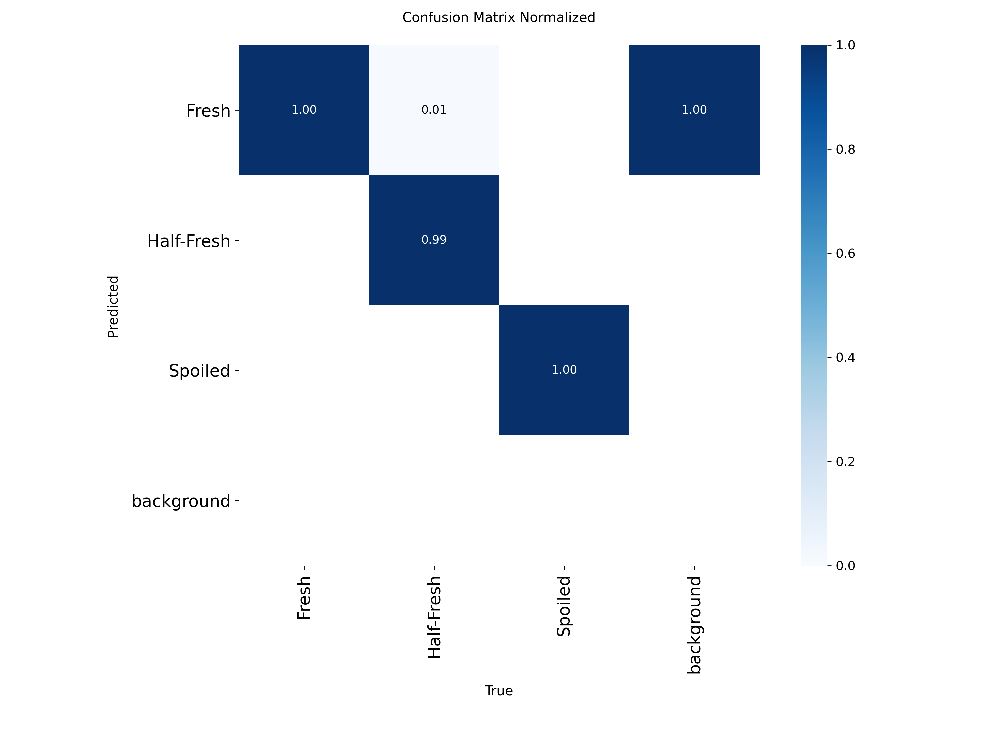

/kaggle/working/runs/detect/train4/confusion_matrix.png


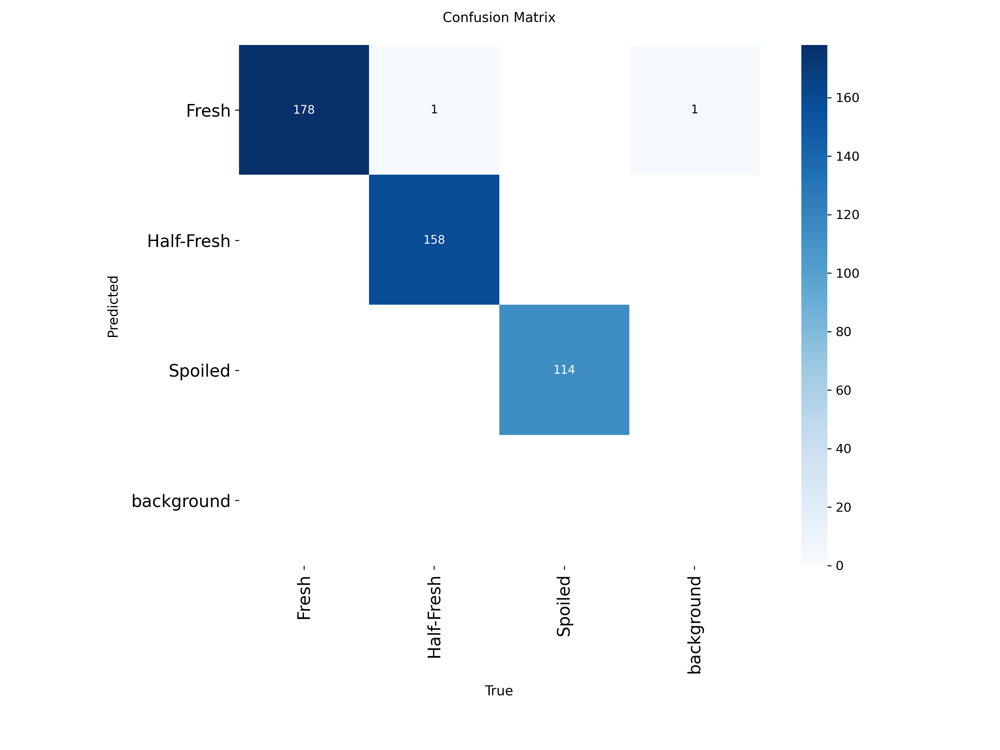

/kaggle/working/runs/detect/train4/BoxPR_curve.png


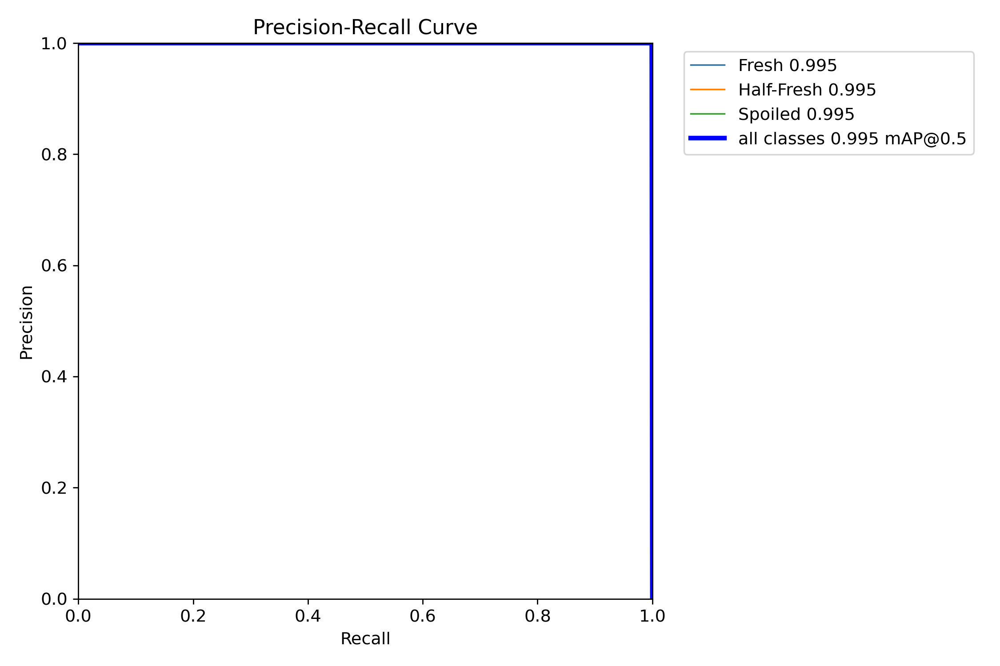

/kaggle/working/runs/detect/train4/BoxP_curve.png


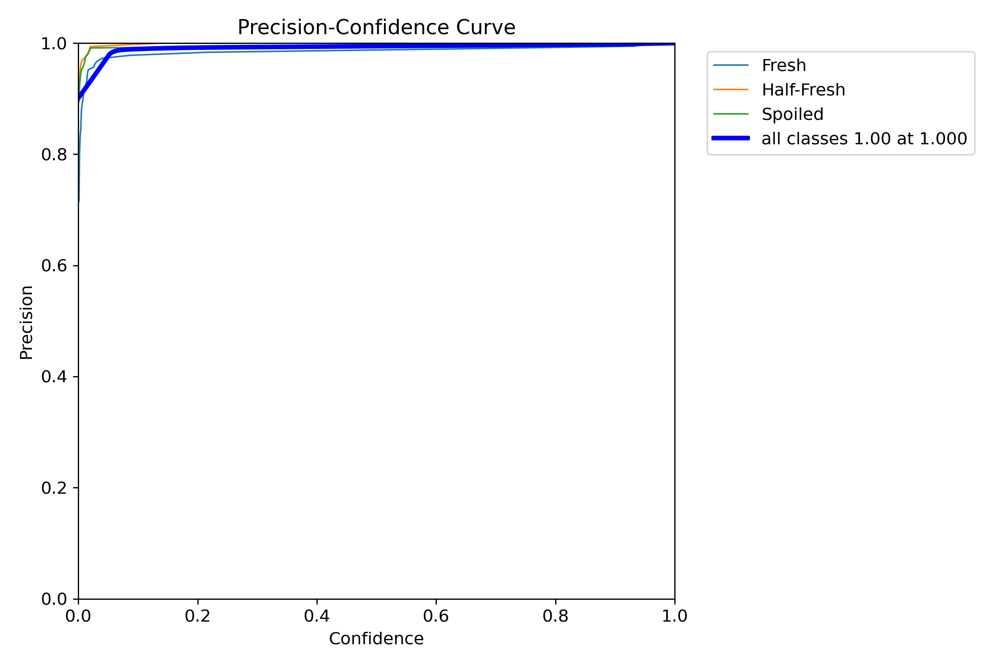

/kaggle/working/runs/detect/train4/BoxR_curve.png


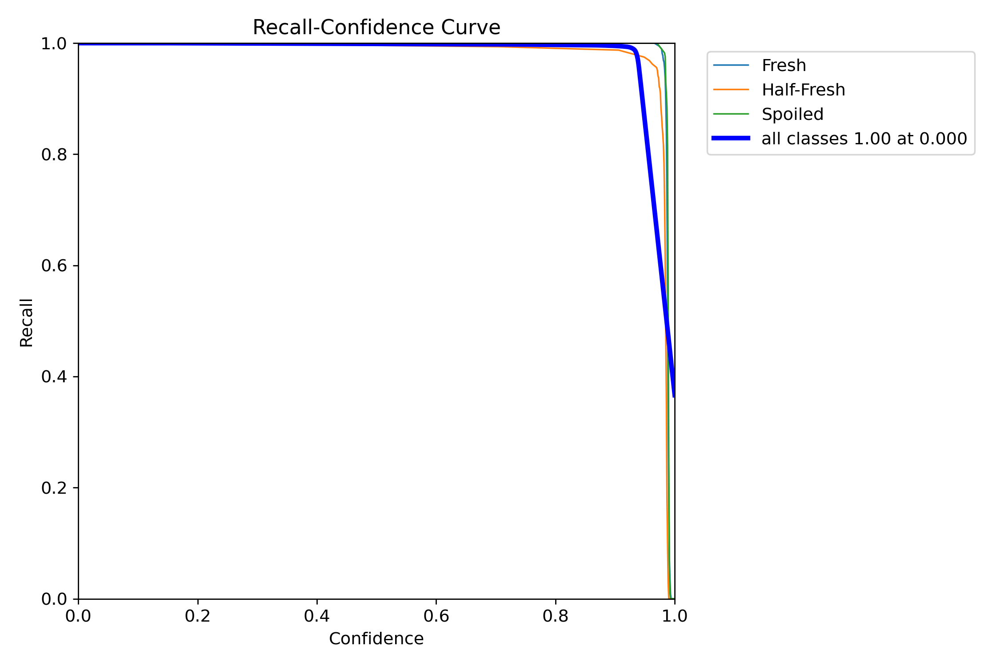

/kaggle/working/runs/detect/train4/results.png


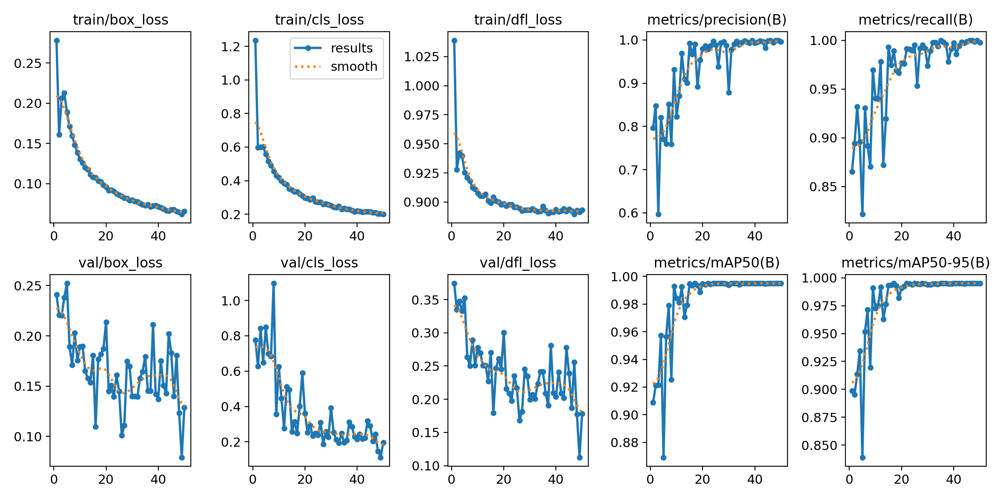

In [19]:
y_model = '/kaggle/working/runs/detect/train4'
resplts = [f for f in os.listdir(y_model) if f.endswith(('.png'))]

for res in resplts:
    print(os.path.join(y_model, res))
    display(Image(filename=os.path.join(y_model, res)))

/kaggle/working/runs/detect/train4/val_batch2_pred.jpg


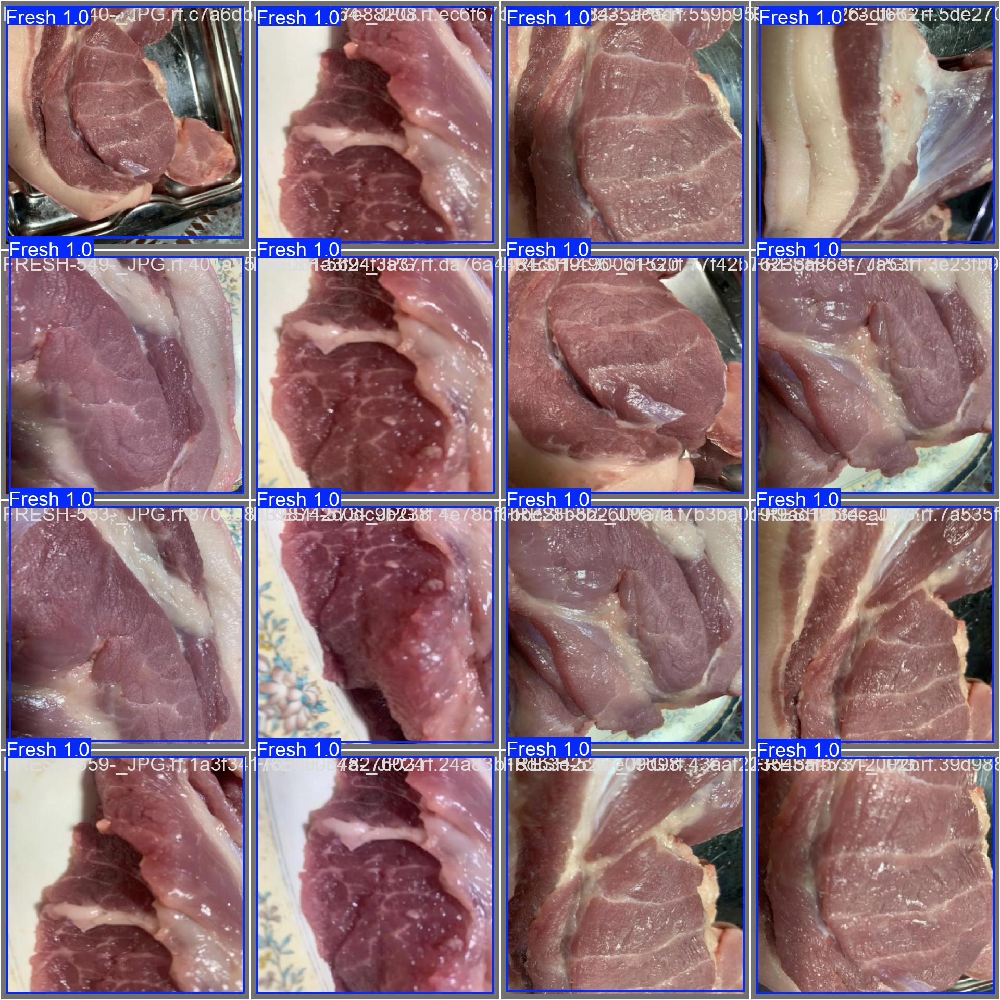

/kaggle/working/runs/detect/train4/val_batch1_labels.jpg


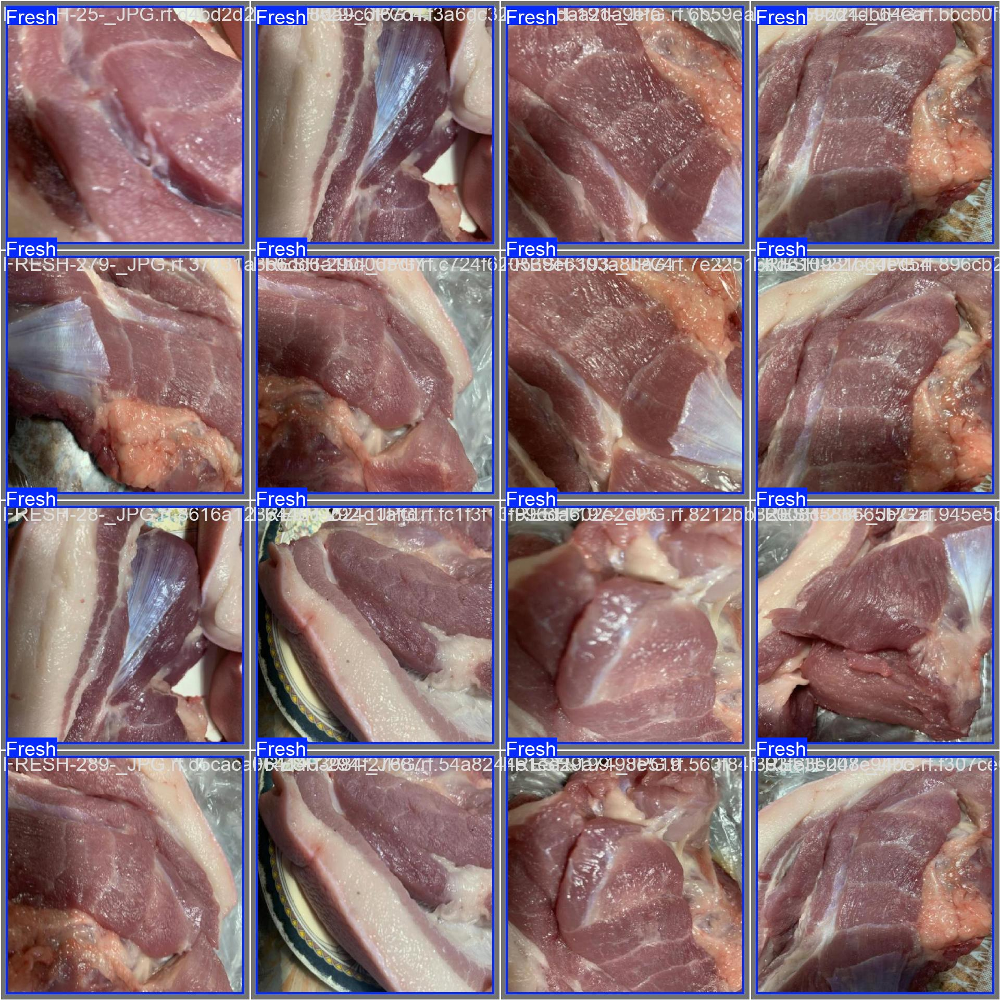

/kaggle/working/runs/detect/train4/val_batch0_pred.jpg


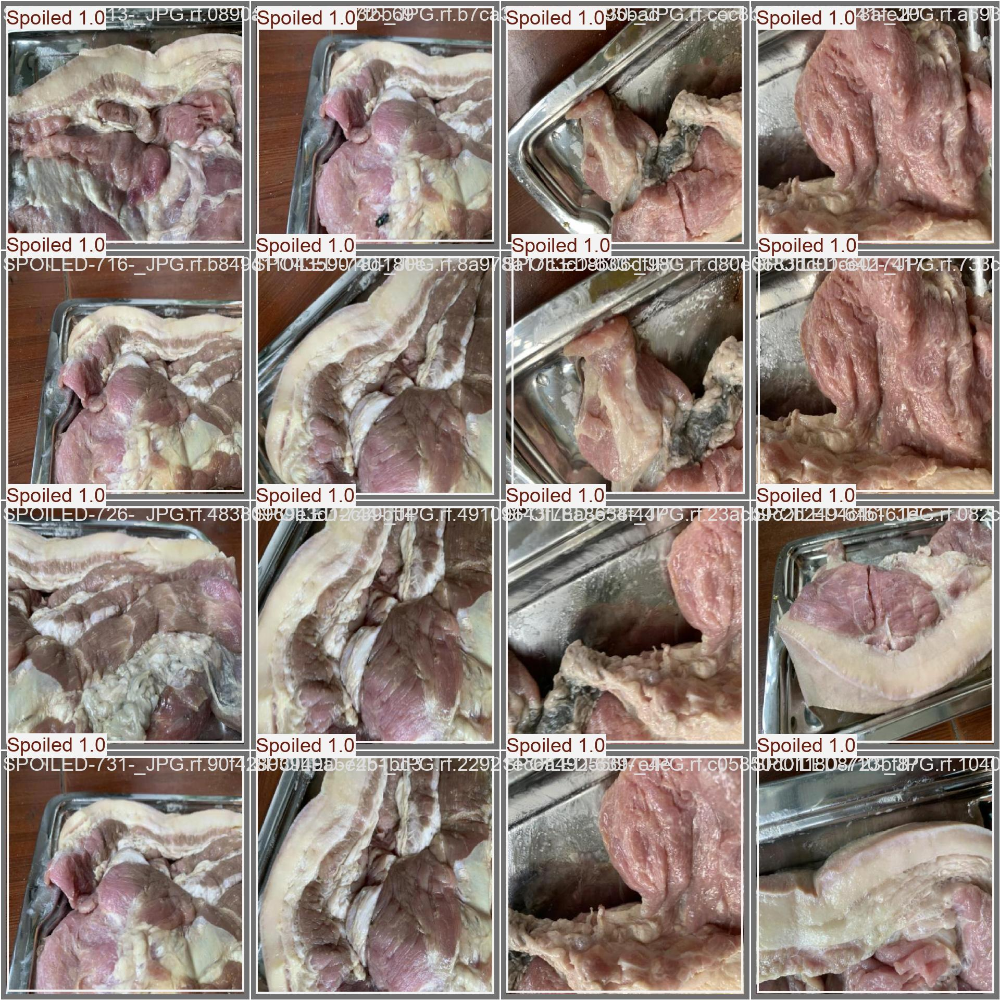

/kaggle/working/runs/detect/train4/train_batch2.jpg


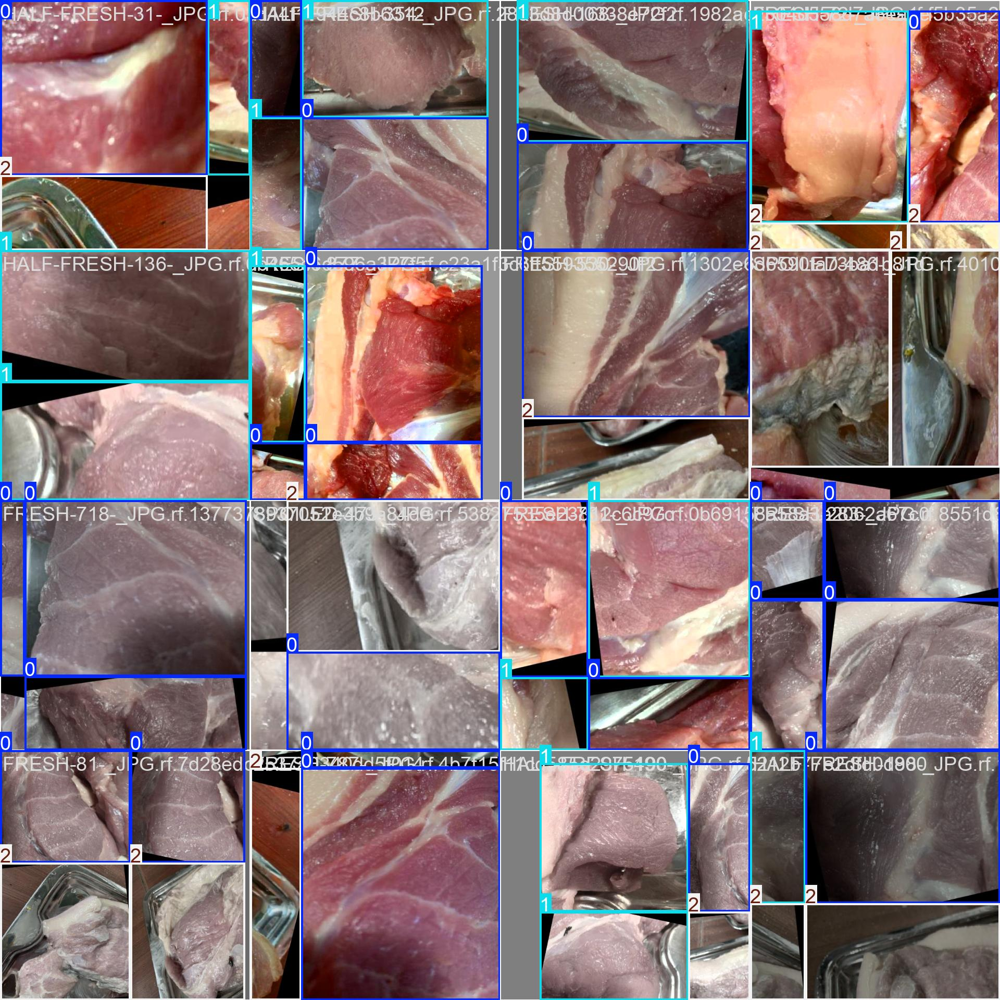

/kaggle/working/runs/detect/train4/labels.jpg


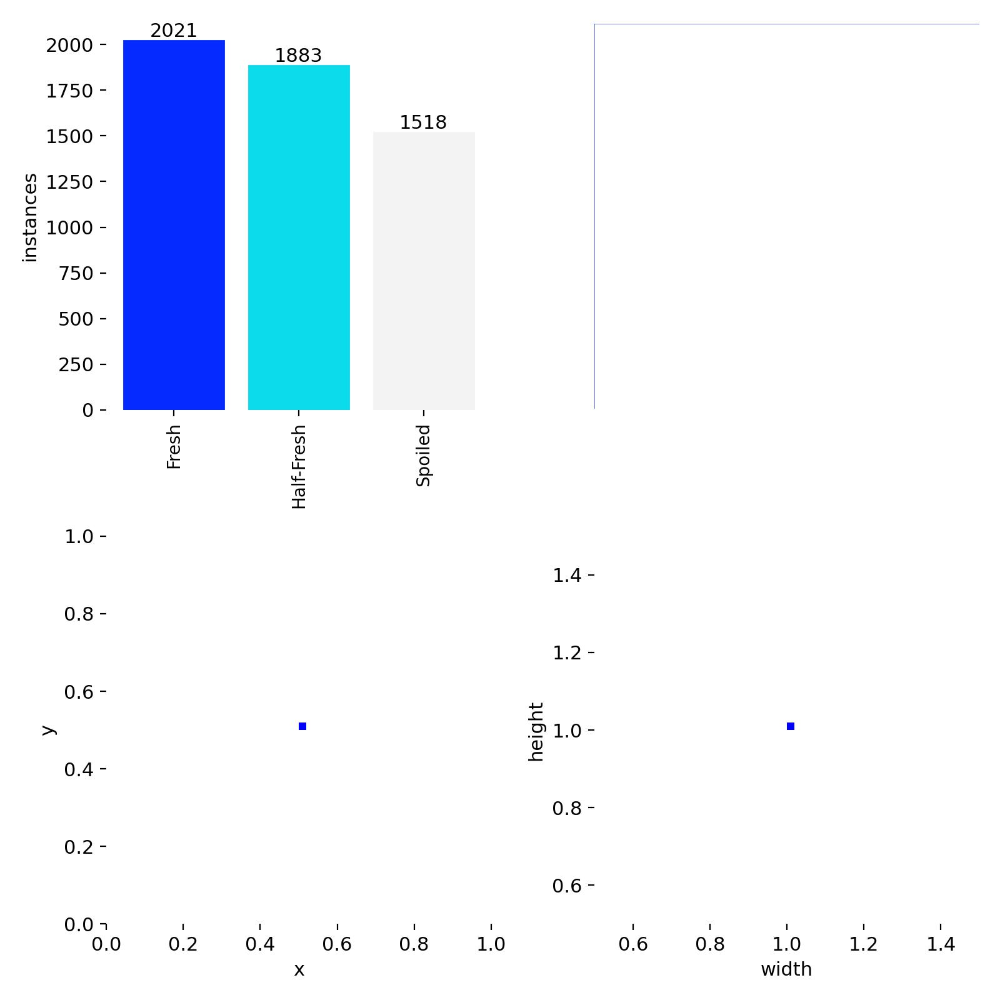

/kaggle/working/runs/detect/train4/train_batch0.jpg


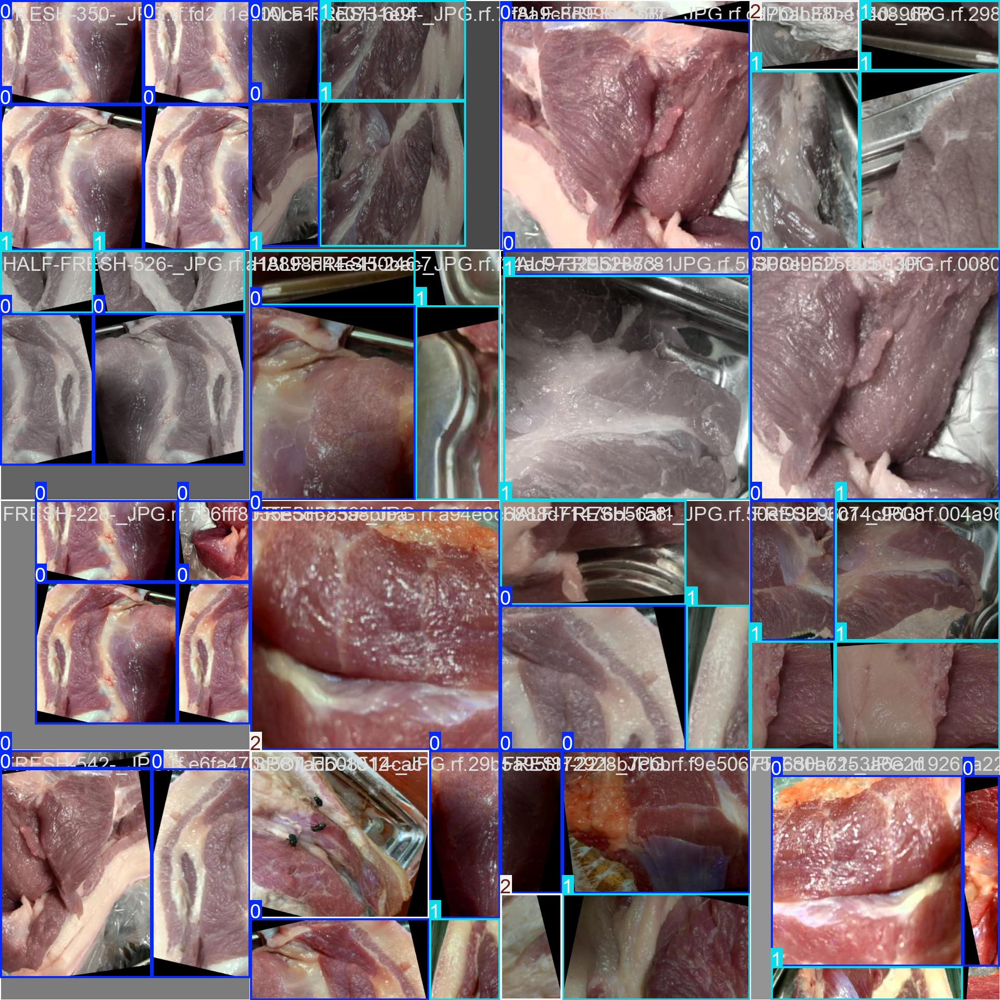

/kaggle/working/runs/detect/train4/val_batch0_labels.jpg


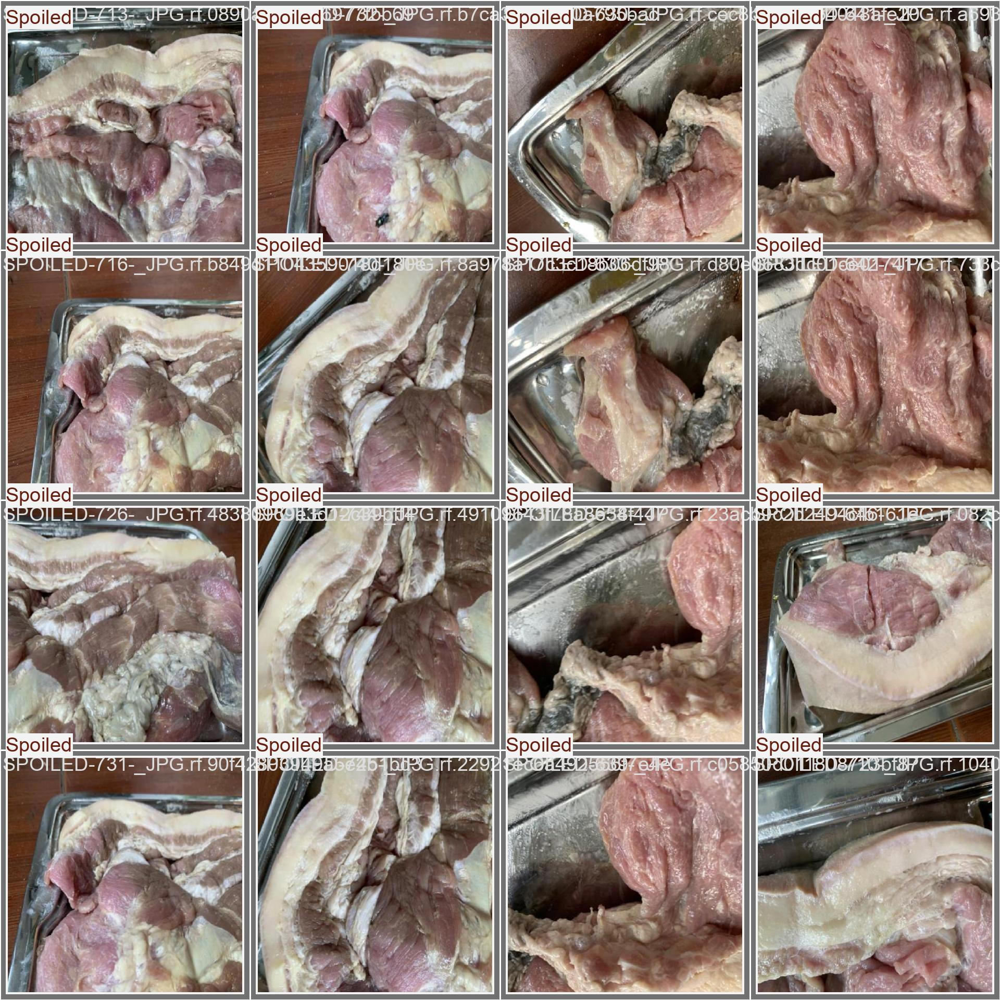

/kaggle/working/runs/detect/train4/val_batch1_pred.jpg


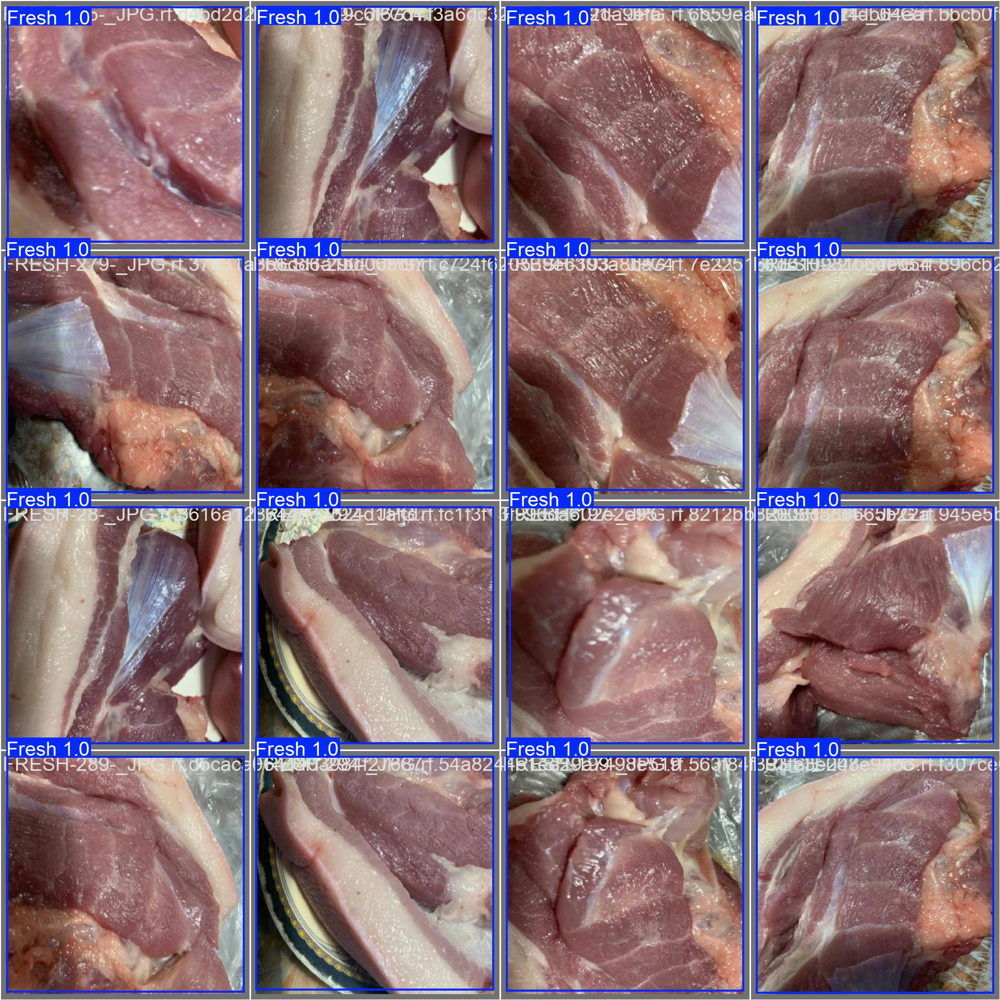

/kaggle/working/runs/detect/train4/val_batch2_labels.jpg


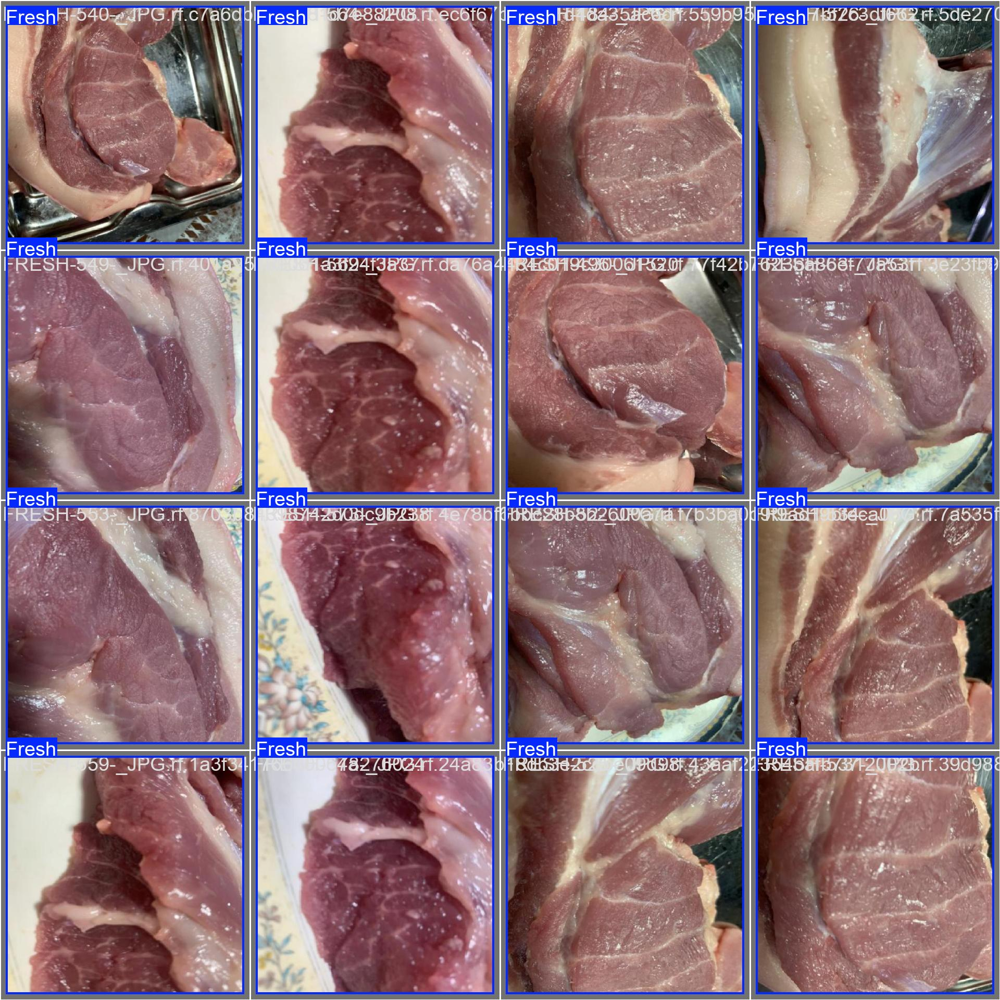

/kaggle/working/runs/detect/train4/train_batch1.jpg


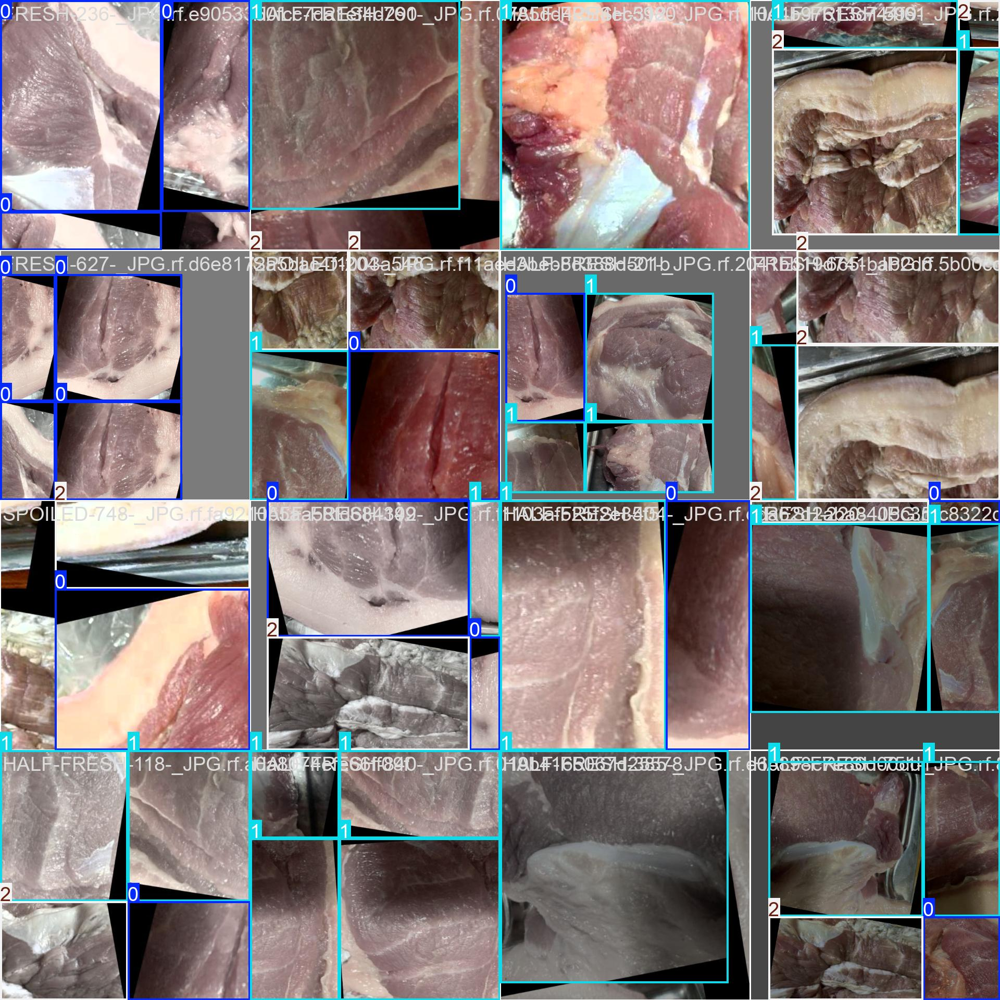

In [20]:
valBatch = [f for f in os.listdir(y_model) if f.endswith(('.jpg'))]

for val in valBatch:
    print(os.path.join(y_model, val))
    display(Image(filename=os.path.join(y_model, val)))

In [22]:
!mkdir -p /kaggle/working/v2mfmrtd
!cp /kaggle/working/runs/detect/train4/weights/best.pt /kaggle/working/v2mfmrtd/v2mfmrtd.pt

In [23]:
# model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

model = YOLO('/kaggle/input/v2mfmrtd/keras/default/1/v2mfmrtd.pt')

In [25]:
from ultralytics import YOLO
import gradio as gr
from PIL import Image

model = YOLO('/kaggle/input/v2mfmrtd/keras/default/1/v2mfmrtd.pt')

def predict(img):
    results = model(img)
    annotated_img = results[0].plot()  
    return Image.fromarray(annotated_img)

demo = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="filepath", label="Upload an Image"),
    outputs=gr.Image(type="pil", label="Prediction"),
    title="YOLO Object Detection",
    description="Upload a photo and get YOLO predictions."
)

demo.launch(share=True)


* Running on local URL:  http://127.0.0.1:7861
* Running on public URL: https://540ec4eeea800fb369.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)



image 1/1 /tmp/gradio/fa47df86c762b7955bdf8d9df0253647f250732d939cf56eca0dff87ad16f3f2/624f0dc1dff9bdccab032f93c33e79de78481770e79e21d3b0469daf51f02797.webp: 416x640 1 Fresh, 42.1ms
Speed: 2.0ms preprocess, 42.1ms inference, 101.8ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /tmp/gradio/3a8c0d5a3248ce64fd8b1c8052bb872cee89f10ea35e3df0e6b218af4b61683a/bf1ed039465f1e433fb2508a2a138d8d.webp: 448x640 1 Fresh, 38.4ms
Speed: 3.7ms preprocess, 38.4ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /tmp/gradio/ccec8e0ff410a85f56291d7785fef015c16727255d8f719e744636960496afdf/chief.webp: 640x416 1 Fresh, 39.5ms
Speed: 3.0ms preprocess, 39.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 416)

image 1/1 /tmp/gradio/653398d67db18316b89a04b4b96ce56affd7047342fb92c3f53059fb9f8ac9ae/360_F_1039664443_wtWmDwr2eNt3vd4CvevCCWIKIkhILd1e.webp: 448x640 1 Spoiled, 13.9ms
Speed: 2.2ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape